In [1]:
import pandas as pd
import geopandas as gpd
import plotly as plt
import folium 

# Loading Environmental Justice Index data

In [2]:
EJI =gpd.read_file('../Data/EJI/EJISanBernardino.geojson')
EJI.head()

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


,objectid,statefp,countyfp,tractce,affgeoid,geoid,name,county,stateabbr,statedesc,...,ep_mhlth,ep_diabetes,epl_bphigh,epl_asthma,epl_cancer,epl_diabetes,epl_mhlth,SHAPE__Length,SHAPE__Area,geometry
0,8839,06,071,000103,1400000US06071000103,06071000103,1.03,San Bernardino,CA,Califor,...,10.2,9.3,0.0768,0.0604,0.0995,0.3190,0.0990,8127.024758,2.848611e+06,"POLYGON ((-1977959.45880 -161657.81960, -19780..."
1,8840,06,071,000104,1400000US06071000104,06071000104,1.04,San Bernardino,CA,Califor,...,9.3,10.1,0.0857,0.0273,0.1118,0.4209,0.0457,11165.267251,4.125057e+06,"POLYGON ((-1978420.45090 -163718.68370, -19786..."
2,8841,06,071,000105,1400000US06071000105,06071000105,1.05,San Bernardino,CA,Califor,...,9.2,9.4,0.0573,0.0220,0.0785,0.3319,0.0411,10508.687958,5.775186e+06,"POLYGON ((-1977854.62430 -164883.70570, -19777..."
3,8842,06,071,000107,1400000US06071000107,06071000107,1.07,San Bernardino,CA,Califor,...,10.5,8.9,0.1459,0.1389,0.3472,0.2668,0.1216,5494.762999,1.406656e+06,"POLYGON ((-1975678.77440 -166054.16440, -19757..."
4,8843,06,071,000108,1400000US06071000108,06071000108,1.08,San Bernardino,CA,Califor,...,11.0,8.8,0.0557,0.1594,0.1118,0.2542,0.1672,8095.601501,2.866269e+06,"POLYGON ((-1978003.58100 -168118.08840, -19780..."


In [3]:
EJI.crs = 'epsg:4326'

# Loading Ontario Census Tract Data

In [4]:
censustracts =pd.read_csv('ontario.csv', 
            dtype= 
            {
        'STATEFP':str,
        'COUNTYFP':str,
        'GEOID': str
            })
censustracts.head()

,Unnamed: 0,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,435,06,071,1307,1400000US06071001307,06071001307,13.07,CT,1281879,0,"POLYGON ((-117.628575 34.09215, -117.628563 34..."
1,436,06,071,1703,1400000US06071001703,06071001703,17.03,CT,1909759,0,"POLYGON ((-117.667639 34.03029, -117.667599 34..."
2,437,06,071,1812,1400000US06071001812,06071001812,18.12,CT,888388,0,"POLYGON ((-117.65077 34.049248999999996, -117...."
3,717,06,071,1002,1400000US06071001002,06071001002,10.02,CT,1203162,0,"POLYGON ((-117.680818 34.074059999999996, -117..."
4,718,06,071,1310,1400000US06071001310,06071001310,13.10,CT,1417244,0,POLYGON ((-117.64145500000001 34.0870819999999...


## Setting the 'geometry' column as a geometry data type

In [5]:
censustracts.dtypes

Unnamed: 0      int64
STATEFP        object
COUNTYFP       object
TRACTCE         int64
AFFGEOID       object
GEOID          object
NAME          float64
LSAD           object
ALAND           int64
AWATER          int64
geometry       object
dtype: object

In [6]:
from shapely.wkt import loads
censustracts.geometry =  censustracts['geometry'].apply(loads)

In [7]:
censustracts=censustracts.set_geometry('geometry')

In [8]:
censustracts.dtypes

Unnamed: 0       int64
STATEFP         object
COUNTYFP        object
TRACTCE          int64
AFFGEOID        object
GEOID           object
NAME           float64
LSAD            object
ALAND            int64
AWATER           int64
geometry      geometry
dtype: object

# Right join to merge the two datasets

In [9]:
EJIdata=pd.merge(EJI, censustracts, how='right',indicator=True, left_on='geoid', right_on='GEOID')
EJIdata.head()

,objectid,statefp,countyfp,tractce,affgeoid,geoid,name,county,stateabbr,statedesc,...,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry_y,_merge
0,8895,06,071,001307,1400000US06071001307,06071001307,13.07,San Bernardino,CA,Califor,...,071,1307,1400000US06071001307,06071001307,13.07,CT,1281879,0,"POLYGON ((-117.62857 34.09215, -117.62856 34.0...",both
1,8907,06,071,001703,1400000US06071001703,06071001703,17.03,San Bernardino,CA,Califor,...,071,1703,1400000US06071001703,06071001703,17.03,CT,1909759,0,"POLYGON ((-117.66764 34.03029, -117.66760 34.0...",both
2,8917,06,071,001812,1400000US06071001812,06071001812,18.12,San Bernardino,CA,Califor,...,071,1812,1400000US06071001812,06071001812,18.12,CT,888388,0,"POLYGON ((-117.65077 34.04925, -117.65074 34.0...",both
3,8889,06,071,001002,1400000US06071001002,06071001002,10.02,San Bernardino,CA,Califor,...,071,1002,1400000US06071001002,06071001002,10.02,CT,1203162,0,"POLYGON ((-117.68082 34.07406, -117.68082 34.0...",both
4,8898,06,071,001310,1400000US06071001310,06071001310,13.10,San Bernardino,CA,Califor,...,071,1310,1400000US06071001310,06071001310,13.10,CT,1417244,0,"POLYGON ((-117.64146 34.08708, -117.64144 34.0...",both


In [10]:
#list of column names 
list(EJIdata)

['objectid',
 'statefp',
 'countyfp',
 'tractce',
 'affgeoid',
 'geoid',
 'name',
 'county',
 'stateabbr',
 'statedesc',
 'location',
 'e_totpop',
 'm_totpop',
 'e_daypop',
 'spl_eji',
 'rpl_eji',
 'spl_ser',
 'rpl_ser',
 'epl_ozone',
 'epl_pm',
 'epl_dslpm',
 'epl_totcr',
 'spl_ebm_theme1',
 'rpl_ebm_dom1',
 'epl_npl',
 'epl_tri',
 'epl_tsd',
 'epl_rmp',
 'epl_coal',
 'epl_lead',
 'spl_ebm_theme2',
 'rpl_ebm_dom2',
 'epl_park',
 'epl_houage',
 'epl_wlkind',
 'spl_ebm_theme3',
 'rpl_ebm_dom3',
 'epl_rail',
 'epl_road',
 'epl_airprt',
 'spl_ebm_theme4',
 'rpl_ebm_dom4',
 'epl_impwtr',
 'spl_ebm_theme5',
 'rpl_ebm_dom5',
 'spl_ebm',
 'rpl_ebm',
 'epl_minrty',
 'spl_svm_dom1',
 'rpl_svm_dom1',
 'epl_pov200',
 'epl_nohsdp',
 'epl_unemp',
 'epl_renter',
 'epl_houbdn',
 'epl_uninsur',
 'epl_noint',
 'spl_svm_dom2',
 'rpl_svm_dom2',
 'epl_age65',
 'epl_age17',
 'epl_disabl',
 'epl_limeng',
 'spl_svm_dom3',
 'rpl_svm_dom3',
 'epl_mobile',
 'epl_groupq',
 'spl_svm_dom4',
 'rpl_svm_dom4',
 'spl_

### version 1 of data kept

In [11]:
#define columns to keep 

'''note from documentation: Variables beginning with “E_” are estimates. 
Variables beginning with “EPL_” are percentile ranks for those estimates. 
Variables beginning with “SPL_” are summed indicator or module ranks for domains, 
modules, or overall scores, and variables beginning with “RPL_” are percentile ranks for domains,
modules or overall scores.'''

columns_to_keep = ['statefp',
                   'countyfp',
                   'affgeoid',
                   'geoid',
                   'county',
                   'location',
                   'e_totpop',
                   'e_daypop',
                   'spl_eji',
                   'rpl_eji',
                   'spl_ser',
                   'rpl_ser',
                   #environmental variable
                   'epl_ozone',
                   'epl_pm',
                   'epl_dslpm',
                   'epl_totcr',
                   'spl_ebm_theme1',
                   'rpl_ebm_dom1',
                    #built environment
                   'epl_park',
                   'epl_wlkind',
                   'epl_rail',
                   'epl_road',
                   'epl_airprt',
                   'spl_ebm_theme4',
                   'rpl_ebm_dom4',
                   #estimates socioeconomic & health
                     'ep_minrty',
                     'ep_pov200',
                     'ep_nohsdp',
                     'ep_unemp',
                     'ep_renter',
                     'ep_houbdn',
                     'ep_uninsur',
                     'ep_noint',
                     'ep_age65',
                     'ep_age17',
                     'ep_disabl',
                     'ep_limeng',
                     'ep_mobile',
                     'ep_groupq',
                     'ep_bphigh',
                     'ep_asthma',
                     'ep_cancer',
                     'ep_mhlth',
                     'ep_diabetes',
                     'rpl_svm',
                    #percentile ranks socioeconomic & health
                     'epl_minrty',
                     'spl_svm_dom1',
                     'rpl_svm_dom1',
                     'epl_pov200',
                     'epl_nohsdp',
                     'epl_unemp',
                     'epl_renter',
                     'epl_houbdn',
                     'epl_uninsur',
                     'epl_noint',
                     'spl_svm_dom2',
                     'rpl_svm_dom2',
                     'epl_age65',
                     'epl_age17',
                     'epl_disabl',
                     'epl_limeng',
                     'spl_svm_dom3',
                     'rpl_svm_dom3',
                     'epl_mobile',
                     'epl_groupq',
                     'spl_svm_dom4',
                     'rpl_svm_dom4',
                     'spl_svm',
                     'rpl_svm',
                     'epl_bphigh',
                     'epl_asthma',
                     'epl_cancer',
                     'epl_diabetes',
                     'epl_mhlth',
                #geometric data  
                  'SHAPE__Length',
                 'SHAPE__Area',
                 'geometry_x',
                  'geometry_y'
                  ]
# create new dataframe with the selected columns
EJIdata2 = EJIdata[columns_to_keep]

In [12]:
EJIdata2.head()

,statefp,countyfp,affgeoid,geoid,county,location,e_totpop,e_daypop,spl_eji,rpl_eji,...,rpl_svm,epl_bphigh,epl_asthma,epl_cancer,epl_diabetes,epl_mhlth,SHAPE__Length,SHAPE__Area,geometry_x,geometry_y
0,06,071,1400000US06071001307,06071001307,San Bernardino,"Census Tract 13.07, San Bernardino County, Calif",4212,2345,1.5940,0.6649,...,0.6535,0.1419,0.3966,0.0881,0.6264,0.5495,4784.119192,1.282029e+06,"POLYGON ((-1963807.20900 -157069.92780, -19639...","POLYGON ((-117.62857 34.09215, -117.62856 34.0..."
1,06,071,1400000US06071001703,06071001703,San Bernardino,"Census Tract 17.03, San Bernardino County, Calif",5680,2388,1.1452,0.4366,...,0.4843,0.1893,0.3389,0.1785,0.5105,0.3970,5575.388721,1.908278e+06,"POLYGON ((-1968855.23160 -162996.94260, -19689...","POLYGON ((-117.66764 34.03029, -117.66760 34.0..."
2,06,071,1400000US06071001812,06071001812,San Bernardino,"Census Tract 18.12, San Bernardino County, Calif",3477,2913,2.2917,0.9054,...,0.9334,0.2437,0.5157,0.0785,0.7878,0.6957,4243.720821,8.871496e+05,"POLYGON ((-1966870.45630 -161282.11530, -19670...","POLYGON ((-117.65077 34.04925, -117.65074 34.0..."
3,06,071,1400000US06071001002,06071001002,San Bernardino,"Census Tract 10.02, San Bernardino County, Calif",5929,1960,1.5803,0.6587,...,0.7037,0.1349,0.4859,0.0400,0.5716,0.6859,4410.506266,1.202110e+06,"POLYGON ((-1969106.41240 -158735.28010, -19691...","POLYGON ((-117.68082 34.07406, -117.68082 34.0..."
4,06,071,1400000US06071001310,06071001310,San Bernardino,"Census Tract 13.10, San Bernardino County, Calif",6193,2689,1.7721,0.7382,...,0.7845,0.2437,0.3679,0.1641,0.6463,0.4797,5320.830383,1.414418e+06,"POLYGON ((-1965084.27710 -157355.52200, -19652...","POLYGON ((-117.64146 34.08708, -117.64144 34.0..."


### version 2 of data kept
This version has less data. We can decide which one we keep/want later. 

In [13]:
columns_to_keep2 = ['statefp',
                   'countyfp',
                   'affgeoid',
                   'geoid',
                   'county',
                   'location',
                   'e_totpop',
                   'e_daypop',
                   'rpl_eji',
                   'rpl_ser',
                   #environmental variable
                   'epl_pm',
                   'epl_dslpm',
                   'epl_totcr',
                    #built environment
                   'epl_park',
                   'epl_wlkind',
                   #transportation
                   'epl_rail',
                   'epl_road',
                   'epl_airprt',
                   'rpl_ebm_dom4',
                   # social vulnerability
                    'rpl_svm',
                    'spl_svm',
                    #health
                    'ep_bphigh',
                     'ep_asthma',
                     'ep_cancer',
                     'ep_mhlth',
                     'ep_diabetes',
                     'epl_bphigh',
                     'epl_asthma',
                     'epl_cancer',
                     'epl_diabetes',
                     'epl_mhlth',
                #geometric data  
                  'SHAPE__Length',
                 'SHAPE__Area',
                    'geometry_x',
                  'geometry_y'
                  ]
# create new dataframe with the selected columns
EJIdata3 = EJIdata2[columns_to_keep2]

In [14]:
EJIdata3.head()

,statefp,countyfp,affgeoid,geoid,county,location,e_totpop,e_daypop,rpl_eji,rpl_ser,...,ep_diabetes,epl_bphigh,epl_asthma,epl_cancer,epl_diabetes,epl_mhlth,SHAPE__Length,SHAPE__Area,geometry_x,geometry_y
0,06,071,1400000US06071001307,06071001307,San Bernardino,"Census Tract 13.07, San Bernardino County, Calif",4212,2345,0.6649,0.8834,...,11.8,0.1419,0.3966,0.0881,0.6264,0.5495,4784.119192,1.282029e+06,"POLYGON ((-1963807.20900 -157069.92780, -19639...","POLYGON ((-117.62857 34.09215, -117.62856 34.0..."
1,06,071,1400000US06071001703,06071001703,San Bernardino,"Census Tract 17.03, San Bernardino County, Calif",5680,2388,0.4366,0.6255,...,10.8,0.1893,0.3389,0.1785,0.5105,0.3970,5575.388721,1.908278e+06,"POLYGON ((-1968855.23160 -162996.94260, -19689...","POLYGON ((-117.66764 34.03029, -117.66760 34.0..."
2,06,071,1400000US06071001812,06071001812,San Bernardino,"Census Tract 18.12, San Bernardino County, Calif",3477,2913,0.9054,0.9883,...,13.7,0.2437,0.5157,0.0785,0.7878,0.6957,4243.720821,8.871496e+05,"POLYGON ((-1966870.45630 -161282.11530, -19670...","POLYGON ((-117.65077 34.04925, -117.65074 34.0..."
3,06,071,1400000US06071001002,06071001002,San Bernardino,"Census Tract 10.02, San Bernardino County, Calif",5929,1960,0.6587,0.7748,...,11.3,0.1349,0.4859,0.0400,0.5716,0.6859,4410.506266,1.202110e+06,"POLYGON ((-1969106.41240 -158735.28010, -19691...","POLYGON ((-117.68082 34.07406, -117.68082 34.0..."
4,06,071,1400000US06071001310,06071001310,San Bernardino,"Census Tract 13.10, San Bernardino County, Calif",6193,2689,0.7382,0.9542,...,12.0,0.2437,0.3679,0.1641,0.6463,0.4797,5320.830383,1.414418e+06,"POLYGON ((-1965084.27710 -157355.52200, -19652...","POLYGON ((-117.64146 34.08708, -117.64144 34.0..."


## Renaming the selected columns 

In [15]:
#listing the column names for version 2 for ease when renaming the columns
columns = list(EJIdata3) 
columns

['statefp',
 'countyfp',
 'affgeoid',
 'geoid',
 'county',
 'location',
 'e_totpop',
 'e_daypop',
 'rpl_eji',
 'rpl_ser',
 'epl_pm',
 'epl_dslpm',
 'epl_totcr',
 'epl_park',
 'epl_wlkind',
 'epl_rail',
 'epl_road',
 'epl_airprt',
 'rpl_ebm_dom4',
 'rpl_svm',
 'rpl_svm',
 'spl_svm',
 'ep_bphigh',
 'ep_asthma',
 'ep_cancer',
 'ep_mhlth',
 'ep_diabetes',
 'epl_bphigh',
 'epl_asthma',
 'epl_cancer',
 'epl_diabetes',
 'epl_mhlth',
 'SHAPE__Length',
 'SHAPE__Area',
 'geometry_x',
 'geometry_y']

In [16]:
EJIdata3.columns = [
'state code',
'county code',
'affgeoid',
'geoid',
'county',
'Location',
'Total Population',
 'Day Population',
 'EJI rank',
 'Environmental Burden Rank',
 'PM 2.5 Rank',
 'Diesel Rank',
 'Air Toxics Cancer Risk',
 'Lack of parks',
 'Lack of walkability',
 'railways',
 'high volume roads',
 'airports',
 'proximity to roads, rail, airports',
 'social vulnerability sum',
 'social vulnerability sum',
 'social vulnerability rank',
 '% high blood pressure',
 '% asthma',
 '% cancer',
 '% mental health',
 '% diabetes',
 'High Blood Pressure Rank',
 'Asthma Rank',
 'Cancer Rank',
 'Diabetes Rank',
 'Mental Health Rank',
 'SHAPE__Length',
 'SHAPE__Area',
 'geometry_x',
 'geometry',
]

In [17]:
EJIdata3.columns

Index(['state code', 'county code', 'affgeoid', 'geoid', 'county', 'Location',
       'Total Population', 'Day Population', 'EJI rank',
       'Environmental Burden Rank', 'PM 2.5 Rank', 'Diesel Rank',
       'Air Toxics Cancer Risk', 'Lack of parks', 'Lack of walkability',
       'railways', 'high volume roads', 'airports',
       'proximity to roads, rail, airports', 'social vulnerability sum',
       'social vulnerability sum', 'social vulnerability rank',
       '% high blood pressure', '% asthma', '% cancer', '% mental health',
       '% diabetes', 'High Blood Pressure Rank', 'Asthma Rank', 'Cancer Rank',
       'Diabetes Rank', 'Mental Health Rank', 'SHAPE__Length', 'SHAPE__Area',
       'geometry_x', 'geometry'],
      dtype='object')

In [18]:
EJIdata3.sample(5)

,state code,county code,affgeoid,geoid,county,Location,Total Population,Day Population,EJI rank,Environmental Burden Rank,...,% diabetes,High Blood Pressure Rank,Asthma Rank,Cancer Rank,Diabetes Rank,Mental Health Rank,SHAPE__Length,SHAPE__Area,geometry_x,geometry
11,06,071,1400000US06071000304,06071000304,San Bernardino,"Census Tract 3.04, San Bernardino County, Califo",6223,4775,0.6777,0.7983,...,12.3,0.1804,0.3679,0.0881,0.6756,0.5153,7544.299389,3.271730e+06,"POLYGON ((-1971621.51480 -158975.96300, -19718...","POLYGON ((-117.70697 34.05973, -117.70683 34.0..."
10,06,071,1400000US06071001808,06071001808,San Bernardino,"Census Tract 18.08, San Bernardino County, Calif",4644,1621,0.4812,0.6796,...,9.3,0.0690,0.2831,0.0688,0.3190,0.3620,4793.215364,1.129591e+06,"POLYGON ((-1964975.22760 -163938.75260, -19650...","POLYGON ((-117.62338 34.03039, -117.62408 34.0..."
36,06,071,1400000US06071001906,06071001906,San Bernardino,"Census Tract 19.06, San Bernardino County, Calif",10032,5254,0.4177,0.6018,...,9.4,0.0881,0.2831,0.0528,0.3319,0.3390,11267.429228,7.800920e+06,"POLYGON ((-1962668.26580 -166546.45140, -19630...","POLYGON ((-117.59316 34.01915, -117.59315 34.0..."
19,06,071,1400000US06071012700,06071012700,San Bernardino,"Census Tract 127, San Bernardino County, Califor",3920,58829,0.5119,0.7151,...,9.2,0.0788,0.2831,0.0881,0.3056,0.2921,28670.738574,2.681420e+07,"POLYGON ((-1961280.03420 -160457.64670, -19614...","POLYGON ((-117.59336 34.06772, -117.59336 34.0..."
24,06,071,1400000US06071001504,06071001504,San Bernardino,"Census Tract 15.04, San Bernardino County, Calif",6006,4005,0.9006,0.9840,...,12.4,0.1349,0.5987,0.0346,0.6853,0.7508,4787.500446,1.279450e+06,"POLYGON ((-1964407.30780 -159391.40330, -19643...","POLYGON ((-117.62924 34.07070, -117.62855 34.0..."


## Making Charts

### Subsetting data

In [19]:
# Subset the data of air pollution
EJIdata2_pollution = EJIdata2[['geoid','epl_ozone', 'epl_pm', 'epl_dslpm','epl_totcr']]
EJIdata2_pollution.head()
EJIdata2_pollution.sort_values(by='epl_dslpm', ascending=False).head(5)


,geoid,epl_ozone,epl_pm,epl_dslpm,epl_totcr
19,06071012700,0.9951,0.9867,0.9367,0.9089
30,06071001803,0.9926,0.9895,0.9109,0.9316
2,06071001812,0.9899,0.9872,0.9018,0.9470
7,06071001810,0.9897,0.9895,0.8955,0.9462
10,06071001808,0.9902,0.9942,0.8919,0.9238


In [20]:
# Rename the columns
EJIdata2_pollution.columns = ['Geoid','Ozone Rank','PM 2.5 Rank','Diesel Rank','Air Toxics Cancer Risk'] 
EJIdata2_pollution.head(5)

,Geoid,Ozone Rank,PM 2.5 Rank,Diesel Rank,Air Toxics Cancer Risk
0,06071001307,0.9952,0.9739,0.7475,0.7015
1,06071001703,0.9891,0.9907,0.8804,0.9168
2,06071001812,0.9899,0.9872,0.9018,0.9470
3,06071001002,0.9913,0.9785,0.7307,0.7717
4,06071001310,0.9944,0.9768,0.7394,0.7096


### Simple bar chart with plot

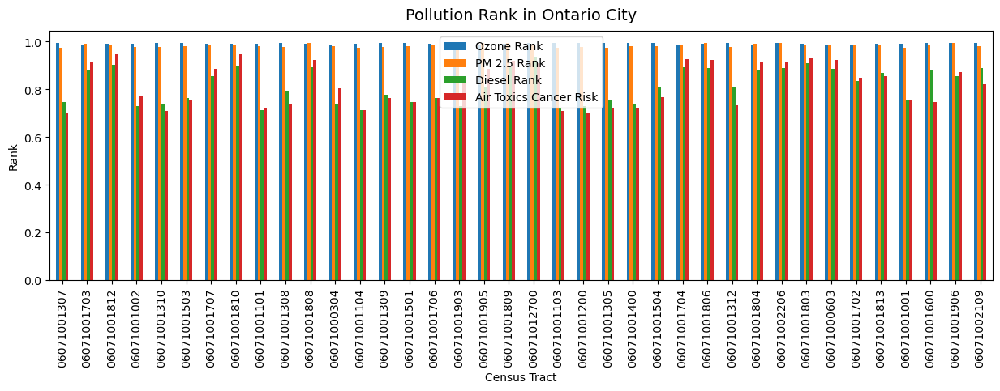

In [32]:
# Create bar chart of air pollution 
fig, ax = plt.subplots(figsize=(15,4))

EJIdata2_pollution.plot.bar(ax=ax,
                                      x='Geoid',
                                      legend=True,
                                      )
ax.set_xlabel('Census Tract') # override x label
ax.set_ylabel('Rank') # override y label
ax.set_title("Pollution Rank in Ontario City",fontsize=14,pad=10); # multi-line title with padding

<AxesSubplot: xlabel='geoid'>

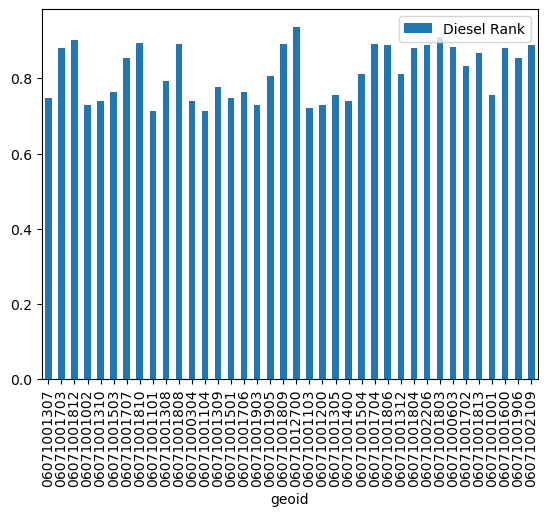

In [22]:
# Create bar chart of diesel rank

EJIdata3_diesel = EJIdata3[['geoid','Diesel Rank']]
EJIdata3_diesel.plot.bar(x='geoid')


### Interactive bar chart with plotly

In [23]:
# Subset dataframe and sort it 

EJIdata3_diesel.sort_values(by='Diesel Rank', ascending=False, inplace = True)
EJIdata3_diesel.head()

/tmp/ipykernel_12263/1652634902.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  EJIdata3_diesel.sort_values(by='Diesel Rank', ascending=False, inplace = True)


,geoid,Diesel Rank
19,06071012700,0.9367
30,06071001803,0.9109
2,06071001812,0.9018
7,06071001810,0.8955
10,06071001808,0.8919


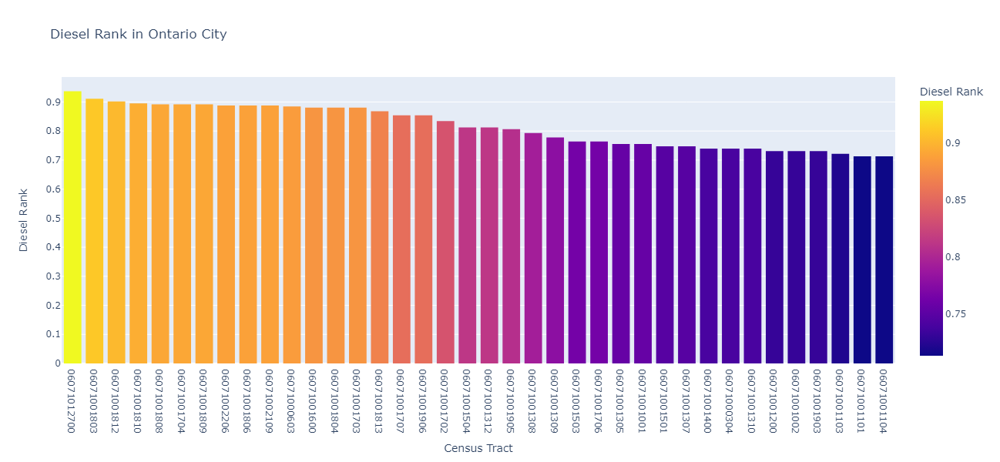

In [24]:
# Create interactive bar chart

# for interactive plots
import plotly.express as px

# add labels by providing a dict
fig = px.bar(
        EJIdata3_diesel,
        x='geoid',
        y='Diesel Rank',
        color = 'Diesel Rank',
        title='Diesel Rank in Ontario City',
        labels={
            'geoid':'Census Tract',       
        },
        height=600
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

## Preparing data for mapping

In [25]:
EJIdata3.dtypes

state code                              object
county code                             object
affgeoid                                object
geoid                                   object
county                                  object
Location                                object
Total Population                         int64
Day Population                           int64
EJI rank                               float64
Environmental Burden Rank              float64
PM 2.5 Rank                            float64
Diesel Rank                            float64
Air Toxics Cancer Risk                 float64
Lack of parks                          float64
Lack of walkability                    float64
railways                               float64
high volume roads                      float64
airports                               float64
proximity to roads, rail, airports     float64
social vulnerability sum               float64
social vulnerability sum               float64
social vulner

In [26]:
EJIdata3=EJIdata3.set_geometry('geometry')
EJIdata3.crs = 'epsg:4326'

In [27]:
EJIdata3 = EJIdata3.to_crs(epsg=4326)
print(EJIdata3.crs)
EJIdata3.head()

epsg:4326


,state code,county code,affgeoid,geoid,county,Location,Total Population,Day Population,EJI rank,Environmental Burden Rank,...,% diabetes,High Blood Pressure Rank,Asthma Rank,Cancer Rank,Diabetes Rank,Mental Health Rank,SHAPE__Length,SHAPE__Area,geometry_x,geometry
0,06,071,1400000US06071001307,06071001307,San Bernardino,"Census Tract 13.07, San Bernardino County, Calif",4212,2345,0.6649,0.8834,...,11.8,0.1419,0.3966,0.0881,0.6264,0.5495,4784.119192,1.282029e+06,"POLYGON ((-1963807.20900 -157069.92780, -19639...","POLYGON ((-117.62857 34.09215, -117.62856 34.0..."
1,06,071,1400000US06071001703,06071001703,San Bernardino,"Census Tract 17.03, San Bernardino County, Calif",5680,2388,0.4366,0.6255,...,10.8,0.1893,0.3389,0.1785,0.5105,0.3970,5575.388721,1.908278e+06,"POLYGON ((-1968855.23160 -162996.94260, -19689...","POLYGON ((-117.66764 34.03029, -117.66760 34.0..."
2,06,071,1400000US06071001812,06071001812,San Bernardino,"Census Tract 18.12, San Bernardino County, Calif",3477,2913,0.9054,0.9883,...,13.7,0.2437,0.5157,0.0785,0.7878,0.6957,4243.720821,8.871496e+05,"POLYGON ((-1966870.45630 -161282.11530, -19670...","POLYGON ((-117.65077 34.04925, -117.65074 34.0..."
3,06,071,1400000US06071001002,06071001002,San Bernardino,"Census Tract 10.02, San Bernardino County, Calif",5929,1960,0.6587,0.7748,...,11.3,0.1349,0.4859,0.0400,0.5716,0.6859,4410.506266,1.202110e+06,"POLYGON ((-1969106.41240 -158735.28010, -19691...","POLYGON ((-117.68082 34.07406, -117.68082 34.0..."
4,06,071,1400000US06071001310,06071001310,San Bernardino,"Census Tract 13.10, San Bernardino County, Calif",6193,2689,0.7382,0.9542,...,12.0,0.2437,0.3679,0.1641,0.6463,0.4797,5320.830383,1.414418e+06,"POLYGON ((-1965084.27710 -157355.52200, -19652...","POLYGON ((-117.64146 34.08708, -117.64144 34.0..."


#Mapping
bring in ware house data

In [28]:
import contextily as ctx

##Import the necessary Libraries and warehouse CSV data
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Warehouses = pd.read_csv('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Warehouse_Data.csv',
        dtype=
        {
            'Assessor parcel number':str,
            'Building classification':str,
        }
)

San_Bern_Parcels = gpd.read_file('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Ontario Parcels/SBCo_Parcel_Polygons.shp')

San_Bern_Parcels.rename(columns = {'ParcelNumb':'Assessor parcel number'}, inplace = True)

#merge the warehouses and parcel shapefile on the San Bernandino County Tax Assessor parcel Number
Warehouse_Parcel=Warehouses.merge(San_Bern_Parcels,on="Assessor parcel number")
Warehouse_Parcel_Geo = gpd.GeoDataFrame(Warehouse_Parcel, geometry='geometry', crs="EPSG:4326")

Create a for loop of variables to plot outcomes and warehouses

/tmp/ipykernel_12263/142154071.py:30: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/142154071.py:30: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/142154071.py:30: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/142154071.py:30: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/142154071.py:30: UserWarning:

Geometry is in a geographic CRS. Results from 'c

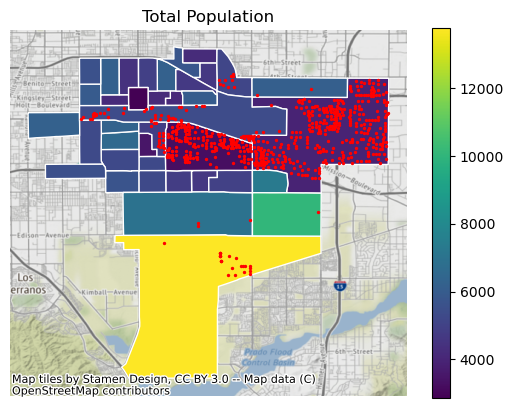

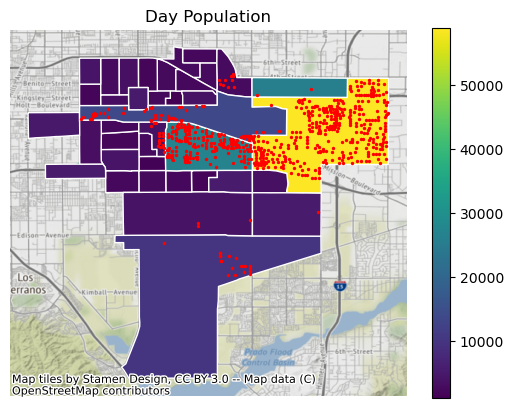

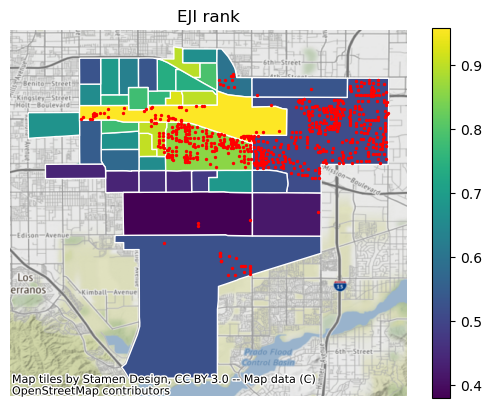

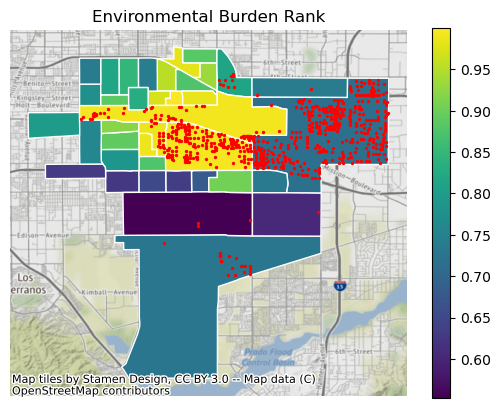

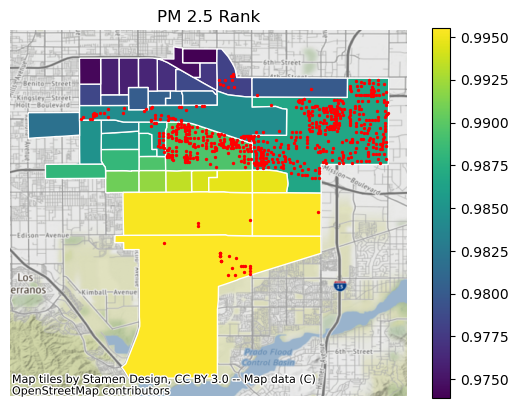

...

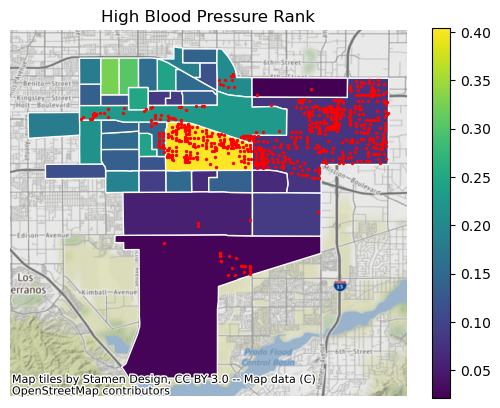

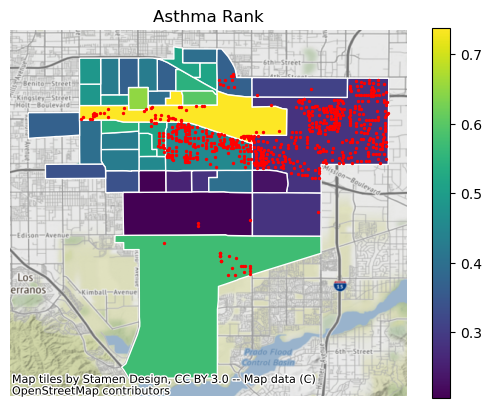

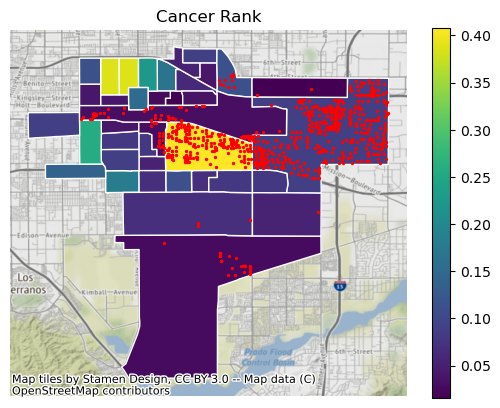

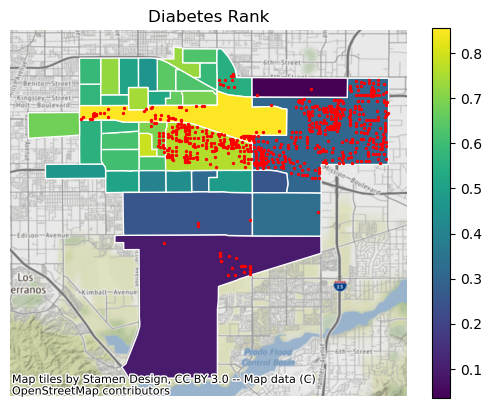

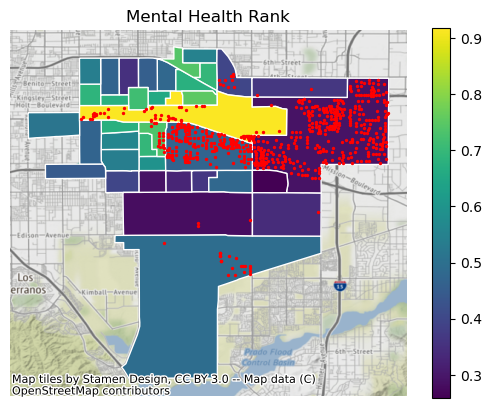

In [30]:
variables = ['Total Population',
 'Day Population',
 'EJI rank',
 'Environmental Burden Rank',
 'PM 2.5 Rank',
 'Diesel Rank',
 'Air Toxics Cancer Risk',
 'Lack of parks',
 'Lack of walkability',
 'railways',
 'high volume roads',
 'airports',
 'proximity to roads, rail, airports',
 'social vulnerability rank',
 '% high blood pressure',
 '% asthma',
 '% cancer',
 '% mental health',
 '% diabetes',
 'High Blood Pressure Rank',
 'Asthma Rank',
 'Cancer Rank',
 'Diabetes Rank',
 'Mental Health Rank']



for variable in variables:
    ax = EJIdata3.plot(column=variable, edgecolor="white", legend=True)
    Warehouse_Parcel_Geo.centroid.plot(ax=ax, color='red',markersize=2);
    ax.set_title(variable)
    ax.set_axis_off()
    ctx.add_basemap(ax, crs=4326)

#Marking Census Tract which have a warehouse
For future regressions and analysis, we would like to mark which census tracts have a warehouse within its borders. We can apply a formula using the within function to mark these census tracts. 

In [31]:
#Check if a census tract contains 

EJIdata3['Warehouse Present'] = EJIdata3.geometry.apply(lambda x: Warehouse_Parcel_Geo.geometry.centroid.within(x).any())
#JIdata3.to_csv('Test.csv')


/tmp/ipykernel_12263/1289865374.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/1289865374.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/1289865374.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/1289865374.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_12263/1289865374.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'c